In [19]:
# import all packages
import numpy as np
import gempy as gp
import matplotlib.pyplot as plt
import pandas as pd
import pyvista as pv
from scipy.interpolate import griddata
from scipy.interpolate import Rbf
from matplotlib import cm
import pykrige
from pykrige.ok3d import OrdinaryKriging3D
from pykrige.uk3d import UniversalKriging3D
from scipy.interpolate import RBFInterpolator
from geomdl import BSpline
from geomdl import utilities as utils
import plotly.graph_objects as go
import ipywidgets
import warnings
warnings.filterwarnings("ignore")

#### NURBS 

In [20]:
# no change needed to create  default geometry, just run
def NURBS(left_x,right_x, lower_left_x, lower_right_x,
          mid_left_x,mid_right_x, upper_left_x, upper_right_x,
          top_left_x,top_right_x,top_x,
          left_y,right_y, lower_left_y, lower_right_y,
          mid_left_y,mid_right_y,upper_left_y, upper_right_y, top_left_y,top_right_y,top_y,
          nr_points=50,fig=True):
    
    # Create a 3-dimensional B-spline Curve
    curve = BSpline.Curve()

    # Set degree
    curve.degree = 3
    # Set control points
    ctrlpts = [
        [left_x, left_y],[lower_left_x, lower_left_y], [mid_left_x, mid_left_y], [upper_left_x, upper_left_y], [top_left_x, top_left_y],
        [top_x, top_y], [top_right_x, top_right_y], [upper_right_x, upper_right_y], [mid_right_x, mid_right_y],[lower_right_x, lower_right_y],
        [right_x, right_y]
    ]
    curve.ctrlpts = ctrlpts

    # Set knot vector
    curve.knotvector = [0, 0,0, *np.arange(0,1+1/(np.array(curve.ctrlpts).shape[0]-3)-0.0001,1/(np.array(curve.ctrlpts).shape[0]-3)), 1, 1, 1]
    curve.knotvector = utils.generate_knot_vector(curve.degree , len(curve.ctrlpts))
    # print(curve.knotvector)
    # Set evaluation delta (controls the number of curve points)
    curve.delta = 1/nr_points

    # Get curve points (the curve will be automatically evaluated)
    curve_points = curve.evalpts

    v=np.array([])
    for i in np.arange(0,1,curve.delta):
        v = np.append([curve.derivatives(u=i,order=1)[1][0],curve.derivatives(u=i,order=1)[1][1]],v)
    v = v.reshape(nr_points,2)
    inv = np.arctan2(v[:, 1], v[:, 0])
    degree = np.mod(np.degrees(inv), 360)
    
    if fig:
      fig,ax=plt.subplots(figsize=(7,7))
      ax.plot(np.array(curve_points)[:,0],np.array(curve_points)[:,1],"-")
      ax.plot(np.array(curve.ctrlpts)[:,0],np.array(curve.ctrlpts)[:,1],"o")
      ax.set_xlim(0,20)
      ax.set_ylim(0,20)

    return curve_points,degree

#### Create model

In [21]:
# no change needed to create default geometry, just run
class batholith_stock:

    def __init__(self,slice_nr = 2,
                 slice_1_parameter = None,
                 slice_2_parameter = None,
                 slice_1_pos = 10,
                 slice_2_pos = 10):
        

        self.slice_nr = slice_nr

        self.slider_1, self.degree_1 = slice_1_parameter
        self.slider_2, self.degree_2= slice_2_parameter

        self.slice_pos_1 = slice_1_pos
        self.slice_pos_2 = slice_2_pos

    def get_input_points(self):
        x_slice_points = self.slider_1
        y_slice_points = self.slider_2

        return x_slice_points,y_slice_points

    def set_input_data(self):

        x_slice_points = self.slider_1
        y_slice_points = self.slider_2
 
        # nr_1 = np.array(x_slice_points).shape[0]
        # nr_2 = np.array(y_slice_points).shape[0]

        x_slice = [np.array(x_slice_points)[:,0],
                   np.ones(len(x_slice_points))*self.slice_pos_1,
                   np.array(x_slice_points)[:,1]]
        x_slice = pd.DataFrame((np.array(x_slice).T),columns=('x','y','z'))

        y_slice = [np.ones(len(y_slice_points))*self.slice_pos_2,
                   np.array(y_slice_points)[:,0],
                   np.array(y_slice_points)[:,1]]
        y_slice = pd.DataFrame((np.array(y_slice).T),columns=('x','y','z'))

        formation = pd.DataFrame(data={'formation':['batholith_stock']*(len(x_slice) + len(y_slice))})

        surface = pd.concat([pd.concat([x_slice,y_slice],ignore_index=True),formation],axis=1)
        orientation_1 = pd.DataFrame(data={"dip":self.degree_1-180,"azimuth":['90']*len(x_slice),"polarity":['1']*len(x_slice)})
        orientation_2 = pd.DataFrame(data={"dip":self.degree_2-180,"azimuth":['0']*len(y_slice),"polarity":['1']*len(y_slice)})

        # orientation_1 = pd.DataFrame(data={"x":[10],"y":[10],"z":[0],"formation":['batholith'],"dip":['0'],"azimuth":['0'],"polarity":['1']})

        # orientation_2 = pd.DataFrame(data={"x":[np.array(x_slice_points)[:,0][np.argmax(np.array(x_slice_points)[:,1])]],"y":[self.slice_pos_1],"z":[np.array(x_slice_points)[:,1].max()],
        #                                    "formation":['batholith'],"dip":['180'],"azimuth":['0'],"polarity":['1']})
        # orientation_3 = pd.DataFrame(data={"x":[self.slice_pos_2],"y":[np.array(y_slice_points)[:,0][np.argmax(np.array(y_slice_points)[:,1])]],"z":[np.array(y_slice_points)[:,1].max()],
        #                                    "formation":['batholith'],"dip":['180'],"azimuth":['0'],"polarity":['1']})
        
        orientation = pd.concat([surface,pd.concat([orientation_1,orientation_2],ignore_index=True)],axis=1)
        return orientation,surface
    
    def create_model(self):

        orientation,surface = self.set_input_data()

        geo_model = gp.create_model('batholith_stock')
        gp.init_data(geo_model, [0, 20, 0, 20, 0, 20], [50, 50, 50],
                orientations_df = orientation,
                surface_points_df = surface,
                default_values=True)
        geo_model.add_surfaces('basement')
        gp.plot_2d(geo_model, plotter_type='basic',show_data=True,legend=False)
        gpv = gp.plot_3d(geo_model, image=True, plotter_type='basic',show_data=True)

        return geo_model

    def compute_model(self):
        
        self.geo_model = self.create_model()

        gp.set_interpolator(self.geo_model,
                    compile_theano=True,
                    theano_optimizer='fast_compile',
                    )
        sol = gp.compute_model(self.geo_model)
        # gp.plot_2d(self.geo_model, show_data=True,direction='x')
        # gp.plot_2d(self.geo_model, show_data=True,direction='y')
        # plt.show()
        # gpv = gp.plot_3d(self.geo_model, image=False, plotter_type='basic',show_data=False)
        x = np.arange(0,20,0.4)
        y = np.arange(0,20,0.4)
        z = np.arange(0,20,0.4)
        xx,yy,zz = np.meshgrid(x,y,z)
        fig = go.Figure(data=[go.Isosurface(z=zz.flatten(), x=xx.flatten(), y=yy.flatten(),
                                    value = self.geo_model.solutions.scalar_field_matrix[0],
                                    isomin = self.geo_model.solutions.scalar_field_at_surface_points[0][0],
                                    isomax = self.geo_model.solutions.scalar_field_at_surface_points[0][0],
                                    surface_count=1,
                                    opacity=0.6,
                                    caps=dict(x_show=False, y_show=False,z_show=False),
                                    colorscale='Viridis',
                                    )])
        fig.update_layout(autosize=True,  
                        width=600, height=600, margin=dict(autoexpand=True))
        fig.show()

        return self.geo_model





In [22]:
# Set default values. Only needed if you want to change the appearance of the geometry shown by default when running cells below. 
#We would recommend working with the sliders instead(see below)

def choose_standard_model(model):

    

    if model == 'batholith_stock':
        left_x_1 = ipywidgets.FloatSlider(value=0.3,min=0.0, max=20.0,description='left x')
        right_x_1 = ipywidgets.FloatSlider(value=19.7,min=0.0, max=20.0,description='right x')
        lower_left_x_1=ipywidgets.FloatSlider(value=0.4,min=0.0, max=20.0,description='lower left x')
        lower_right_x_1=ipywidgets.FloatSlider(value=19.6,min=0.0, max=20.0,description='lower right x')
        mid_left_x_1 = ipywidgets.FloatSlider(value=0.5,min=0.0, max=20.0,description='mid left x')
        mid_right_x_1 = ipywidgets.FloatSlider(value=19.5,min=0.0, max=20.0,description='mid right x')
        upper_left_x_1= ipywidgets.FloatSlider(value=0.8,min=0.0, max=20.0,description='upper left x')
        upper_right_x_1=ipywidgets.FloatSlider(value=19.2,min=0.0, max=20.0,description='upper right x')
        top_left_x_1 = ipywidgets.FloatSlider(value=1,min=0.0, max=20.0,description='top left x')
        top_right_x_1 = ipywidgets.FloatSlider(value=19,min=0.0, max=20.0,description='top right x')
        top_x_1 = ipywidgets.FloatSlider(value=10,min=0.0, max=25.0,description='top x')

        left_y_1 = ipywidgets.FloatSlider(value=0,min=0.0, max=20.0, orientation='vertical',description='left y')
        right_y_1 = ipywidgets.FloatSlider(value=0,min=0.0, max=20.0, orientation='vertical',description='right y')
        lower_left_y_1= ipywidgets.FloatSlider(value=2.5,min=0.0, max=20.0, orientation='vertical',description='lower left y')
        lower_right_y_1= ipywidgets.FloatSlider(value=2.5,min=0.0, max=20.0, orientation='vertical',description='lower right y')
        mid_left_y_1 = ipywidgets.FloatSlider(value=5,min=0.0, max=20.0, orientation='vertical',description='mid left y')
        mid_right_y_1 = ipywidgets.FloatSlider(value=5,min=0.0, max=20.0, orientation='vertical',description='mid right y')
        upper_left_y_1= ipywidgets.FloatSlider(value=7.5,min=0.0, max=20.0, orientation='vertical',description='upper left y')
        upper_right_y_1=ipywidgets.FloatSlider(value=7.5,min=0.0, max=20.0, orientation='vertical',description='upper right y')
        top_left_y_1 = ipywidgets.FloatSlider(value=10,min=0.0, max=20.0, orientation='vertical',description='top left y')
        top_right_y_1 = ipywidgets.FloatSlider(value=10,min=0.0, max=20.0, orientation='vertical',description='top right y')
        top_y_1 = ipywidgets.FloatSlider(value=20,min=0.0, max=25.0, orientation='vertical',description='top y')

        left_x_2 = ipywidgets.FloatSlider(value=0.3,min=0.0, max=20.0,description='left x')
        right_x_2 = ipywidgets.FloatSlider(value=19.7,min=0.0, max=20.0,description='right x')
        lower_left_x_2= ipywidgets.FloatSlider(value=0.4,min=0.0, max=20.0,description='lower left x')
        lower_right_x_2= ipywidgets.FloatSlider(value=19.6,min=0.0, max=20.0,description='lower right x')
        mid_left_x_2 = ipywidgets.FloatSlider(value=0.5,min=0.0, max=20.0,description='mid left x')
        mid_right_x_2 = ipywidgets.FloatSlider(value=19.5,min=0.0, max=20.0,description='mid right x')
        upper_left_x_2= ipywidgets.FloatSlider(value=0.8,min=0.0, max=20.0,description='upper left x')
        upper_right_x_2=ipywidgets.FloatSlider(value=19.2,min=0.0, max=20.0,description='upper right x')
        top_left_x_2 = ipywidgets.FloatSlider(value=1,min=0.0, max=20.0,description='top left x')
        top_right_x_2 = ipywidgets.FloatSlider(value=19,min=0.0, max=20.0,description='top right x')
        top_x_2 = ipywidgets.FloatSlider(value=10,min=0.0, max=25.0,description='top x')

        left_y_2 = ipywidgets.FloatSlider(value=0,min=0.0, max=20.0, orientation='vertical',description='left y')
        right_y_2 = ipywidgets.FloatSlider(value=0,min=0.0, max=20.0, orientation='vertical',description='right y')
        lower_left_y_2= ipywidgets.FloatSlider(value=2.5,min=0.0, max=20.0, orientation='vertical',description='lower left y')
        lower_right_y_2= ipywidgets.FloatSlider(value=2.5,min=0.0, max=20.0, orientation='vertical',description='lower right y')
        mid_left_y_2 = ipywidgets.FloatSlider(value=5,min=0.0, max=20.0, orientation='vertical',description='mid left y')
        mid_right_y_2 = ipywidgets.FloatSlider(value=5,min=0.0, max=20.0, orientation='vertical',description='mid right y')
        upper_left_y_2=ipywidgets.FloatSlider(value=7.5,min=0.0, max=20.0, orientation='vertical',description='upper left y')
        upper_right_y_2=ipywidgets.FloatSlider(value=7.5,min=0.0, max=20.0, orientation='vertical',description='upper right y')
        top_left_y_2 = ipywidgets.FloatSlider(value=10,min=0.0, max=20.0, orientation='vertical',description='top left y')
        top_right_y_2 = ipywidgets.FloatSlider(value=10,min=0.0, max=20.0, orientation='vertical',description='top right y')
        top_y_2 = ipywidgets.FloatSlider(value=20,min=0.0, max=25.0, orientation='vertical',description='top y')

        nr_points_1 = ipywidgets.IntSlider(value=70,min=10, max=100, step=5,description='nr sampled from curve')
        nr_points_2 = ipywidgets.IntSlider(value=70,min=10, max=100, step=5,description='nr sampled from curve')

    
    return left_x_1,right_x_1, lower_left_x_1, lower_right_x_1, mid_left_x_1,mid_right_x_1,upper_left_x_1, upper_right_x_1, top_left_x_1,top_right_x_1,top_x_1,left_x_2,right_x_2,lower_left_x_2, lower_right_x_2, mid_left_x_2,mid_right_x_2,upper_left_x_2, upper_right_x_2, top_left_x_2,top_right_x_2,top_x_2,left_y_1,right_y_1,lower_left_y_1, lower_right_y_1, mid_left_y_1,mid_right_y_1,upper_left_y_1, upper_right_y_1, top_left_y_1,top_right_y_1,top_y_1,left_y_2,right_y_2,lower_left_y_2, lower_right_y_2, mid_left_y_2,mid_right_y_2,upper_left_y_2, upper_right_y_2, top_left_y_2,top_right_y_2,top_y_2,nr_points_1,nr_points_2

# make your batholith/stock shape here

### slider_1 is x_slice and slider_2 is y_slice 


#### left : the bottom left control point of NURBS 

#### right : the bottom right control point of NURBS 

#### lower_left:  the lower left control point of NURBS at 12,5% thickness 

#### lower_right: the lower right control point of NURBS at 12,5% thickness 

#### mid_left: the left control point of NURBS at 25% thickness 

#### mid_right: the right control point of NURBS at 25% thickness 

#### upper_left:  the left control point of NURBS at 37,5% thickness 

#### upper_right: the right control point of NURBS at 37,5% thickness 

#### top_left: the left control point of NURBS at 50% thickness 

#### top_right: the right control point of NURBS at 50% thickness 

#### top : top control point  at 100% thickness

In [23]:
# no change needed to create  default geometry, just run
button = ipywidgets.ToggleButtons(
    options=['batholith_stock'],
    description='choose standard model:',
    disabled=False
)
display(button)

ToggleButtons(description='choose standard model:', options=('batholith_stock',), value='batholith_stock')

In [24]:
# after running this cell, the chosen default geometry can be customized freely by dragging the sliders
out = choose_standard_model(model=button.value)
left_x_1,right_x_1, lower_left_x_1, lower_right_x_1, mid_left_x_1,mid_right_x_1,upper_left_x_1, upper_right_x_1, top_left_x_1,top_right_x_1,top_x_1,left_x_2,right_x_2,lower_left_x_2, lower_right_x_2, mid_left_x_2,mid_right_x_2,upper_left_x_2, upper_right_x_2, top_left_x_2,top_right_x_2,top_x_2,left_y_1,right_y_1,lower_left_y_1, lower_right_y_1, mid_left_y_1,mid_right_y_1,upper_left_y_1, upper_right_y_1, top_left_y_1,top_right_y_1,top_y_1,left_y_2,right_y_2,lower_left_y_2, lower_right_y_2, mid_left_y_2,mid_right_y_2,upper_left_y_2, upper_right_y_2, top_left_y_2,top_right_y_2,top_y_2, nr_points_1,nr_points_2 = out
slider_1 = ipywidgets.interactive_output(NURBS,
                    {"left_x":left_x_1,
                    "right_x":right_x_1,
                    "lower_left_x":lower_left_x_1,
                    "lower_right_x":lower_right_x_1,
                    "mid_left_x":mid_left_x_1,
                    "mid_right_x":mid_right_x_1,
                    "upper_left_x":upper_left_x_1,
                    "upper_right_x":upper_right_x_1,
                    "top_left_x":top_left_x_1,
                    "top_right_x":top_right_x_1,
                    "top_x":top_x_1,
                    "left_y":left_y_1,
                    "right_y":right_y_1,
                    "lower_left_y":lower_left_y_1,
                    "lower_right_y":lower_right_y_1,
                    "mid_left_y":mid_left_y_1,
                    "mid_right_y":mid_right_y_1,
                    "upper_left_y":upper_left_y_1,
                    "upper_right_y":upper_right_y_1,
                    "top_left_y":top_left_y_1,
                    "top_right_y":top_right_y_1,
                    "top_y":top_y_1,
                    "nr_points":nr_points_1})
ui_1_x = ipywidgets.VBox([left_x_1,lower_left_x_1,mid_left_x_1,upper_left_x_1,top_left_x_1,top_x_1,top_right_x_1,upper_right_x_1,mid_right_x_1,lower_right_x_1, right_x_1,nr_points_1])
ui_2_x = ipywidgets.HBox([left_y_1,lower_left_y_1,mid_left_y_1,upper_left_y_1, top_left_y_1,top_y_1,top_right_y_1,upper_right_y_1, mid_right_y_1,lower_right_y_1, right_y_1])

ui_x = ipywidgets.HBox([ui_1_x,ui_2_x])
display(ui_x,slider_1)
slider_2 = ipywidgets.interactive_output(NURBS,
                    {"left_x":left_x_2,
                    "right_x":right_x_2,
                    "lower_left_x":lower_left_x_2,
                    "lower_right_x":lower_right_x_2,
                    "mid_left_x":mid_left_x_2,
                    "mid_right_x":mid_right_x_2,
                    "upper_left_x":upper_left_x_2,
                    "upper_right_x":upper_right_x_2,
                    "top_left_x":top_left_x_2,
                    "top_right_x":top_right_x_2,
                    "top_x":top_x_2,
                    "left_y":left_y_2,
                    "right_y":right_y_2,
                    "lower_left_y":lower_left_y_2,
                    "lower_right_y":lower_right_y_2,
                    "mid_left_y":mid_left_y_2,
                    "mid_right_y":mid_right_y_2,
                    "upper_left_y":upper_left_y_2,
                    "upper_right_y":upper_right_y_2,
                    "top_left_y":top_left_y_2,
                    "top_right_y":top_right_y_2,
                    "top_y":top_y_2,
                    "nr_points":nr_points_2})
ui_1_y = ipywidgets.VBox([left_x_2,lower_left_x_2,mid_left_x_2,upper_left_x_2, top_left_x_2,top_x_2,top_right_x_2,upper_right_x_2, mid_right_x_2, lower_right_x_2,right_x_2,nr_points_2])
ui_2_y = ipywidgets.HBox([left_y_2,lower_left_y_2, mid_left_y_2,upper_left_y_2,top_left_y_2,top_y_2,top_right_y_2,upper_right_y_2,mid_right_y_2,lower_right_y_2, right_y_2])

ui_y = ipywidgets.HBox([ui_1_y,ui_2_y])
display(ui_y,slider_2)

Output()

Output()

Active grids: ['regular']


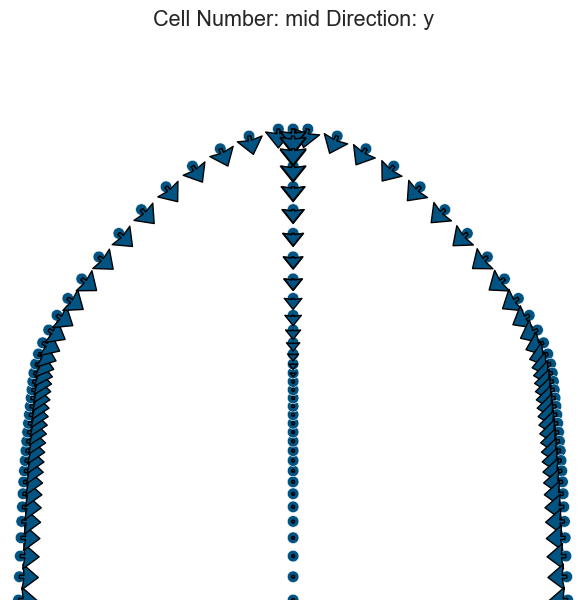

Setting kriging parameters to their default values.
Compiling theano function...
Level of Optimization:  fast_compile
Device:  cpu
Precision:  float64
Number of faults:  0
Compilation Done!
Kriging values: 
                     values
range            34.641016
$C_o$            28.571429
drift equations        [3]


In [25]:
#run this to create 3D model from your customized geometry
slice_1 = NURBS(left_x_1.value,right_x_1.value,lower_left_x_1.value, lower_right_x_1.value,mid_left_x_1.value,mid_right_x_1.value,upper_left_x_1.value, upper_right_x_1.value,top_left_x_1.value,top_right_x_1.value,top_x_1.value,
                          left_y_1.value,right_y_1.value,lower_left_y_1.value, lower_right_y_1.value, mid_left_y_1.value,mid_right_y_1.value,upper_left_y_1.value, upper_right_y_1.value,top_left_y_1.value,top_right_y_1.value,top_y_1.value,
                          nr_points_1.value,fig=False)
slice_2 = NURBS(left_x_2.value,right_x_2.value,lower_left_x_2.value, lower_right_x_2.value,mid_left_x_2.value,mid_right_x_2.value, upper_left_x_2.value, upper_right_x_2.value,top_left_x_2.value,top_right_x_2.value,top_x_2.value,
                          left_y_2.value,right_y_2.value,lower_left_y_2.value, lower_right_y_2.value, mid_left_y_2.value,mid_right_y_2.value,upper_left_y_2.value, upper_right_y_2.value,top_left_y_2.value,top_right_y_2.value,top_y_2.value,
                          nr_points_2.value,fig=False)

geo_model = batholith_stock(slice_1_parameter=slice_1,slice_2_parameter=slice_2,slice_1_pos=10,slice_2_pos=10).compute_model()